## Implement the relue base percentage

In [1]:
import numpy as np
import os
from skimage import measure
import pylab as plt
import openslide as ops
from skimage.measure import find_contours
from skimage.morphology import *

path = '/home/zyx31/DATA_CRLM/CRLM/Results/WR_lev0ps448_stp_128/'


In [2]:

def map_back_region(treg_index,org_size,regions):
    # 0~1 map for the regions 
    tregion = regions[treg_index]
    treg2 = np.zeros(org_size[:2])
    a,b,c,d = tregion.bbox
    treg2[a:c,b:d] = tregion.filled_image
    return treg2

def filter_regions(regions,min_size):
    filtered_regions_index = []
    for tindex, tregion in enumerate(regions):
        if tregion.area > min_size:
            filtered_regions_index.append(tindex)
            
    return filtered_regions_index

def check_region(treg_index,org_size,regions,tumour_ratio=0.02):
    region_areas = [tregion.area for tregion in regions]
    max_index = region_areas.index(max(region_areas))
    
    tmap = map_back_region(treg_index,org_size,regions)
    tmp_re4 = np.copy(tmp_re1)
    tmp_re4[tmap==0] = 12
    
    ## Keep the max region,
    if treg_index == max_index:
        return tmap
    elif np.sum(tmp_re4==3)/np.sum(tmp_re4 !=12) + \
        np.sum(tmp_re4==1)/np.sum(tmp_re4!=12) + \
        np.sum(tmp_re4==5)/np.sum(tmp_re4!=12)  > tumour_ratio:
        return tmap
    else:
        return None

def rule_based_mapbak(regions,org_size,min_size_ratio=0.01,tumour_ratio=0.02):
    ## Tumour rate only for the second biggiest region  
    ## min_size_ratio controls the region for consideration
    min_size = np.prod(org_size[:2])*min_size_ratio
    filtered_regions_index = filter_regions(regions,min_size)
    init_maps = np.zeros(org_size[:2])
    for tindex in filtered_regions_index:
        #print(tindex)
        ttmap = check_region(tindex,org_size,regions,tumour_ratio)
        if ttmap is not None:
            #print(tindex)
            init_maps += ttmap
    return init_maps

In [3]:
from collections import Counter,OrderedDict

def count_set(tmp_in):
    """
    input size should be 11x11
    calculate on  three different levels
    """
    com_pres = list(set(tmp_in.flatten()))
    
    cnt = Counter()
    for t_label in com_pres:
        cnt[t_label] = np.sum(tmp_in==t_label)
    return OrderedDict(sorted(cnt.items(), key=lambda t: t[1],reverse=True))


def get_components(tindex,counter_list,re_size= 10):
    
    ty,tx = counter_list[tindex]
    tmp_in = tmp_re1[int(tx)-re_size:int(tx)+re_size,int(ty)-re_size:int(ty)+re_size]
    trang = 4
    cnt3 = count_set(tmp_in[trang:-trang,trang:-trang])
    #print(cnt3)

    trang = 1
    cnt1 = count_set(tmp_in[trang:-trang,trang:-trang])
    #print(cnt1)
        
    return cnt3, cnt1

def check_border(tindex,counter_list):
    """
    Check the boarder, label them with different categories
    """
    label_list = ['Domestic','Replacement','Portal_Aera','Other']
    label = None
    
    cnt3,cnt1 = get_components(tindex,counter_list)
    
    ## Conditions
    
    ta,tb = list(cnt3.keys())[:2],list(cnt1.keys())[:2]
    
    if not (0 in ta) or  not (0 in tb):
        if (9 in ta) or (9 in tb):
            return 2
        else:
            return 3
    else: 
        if 3 in ta and 3 in tb:
            return 1
        if 2 in ta  and 2 in tb:
            return 0
        if 4 in ta  and 4 in tb:
            return 0
        
        return 3

#check_border(10,cts[cts_filtered[0]])


/home/zyx31/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


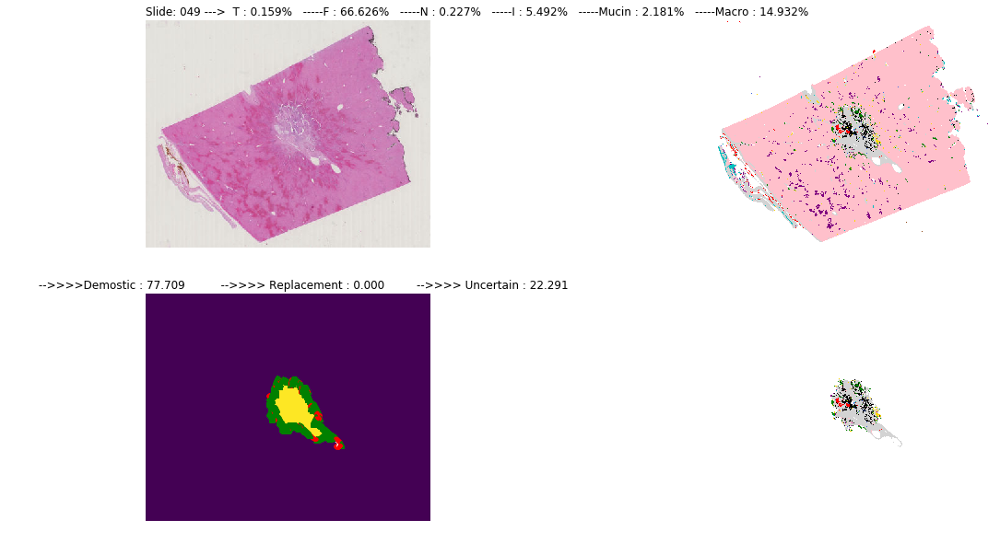

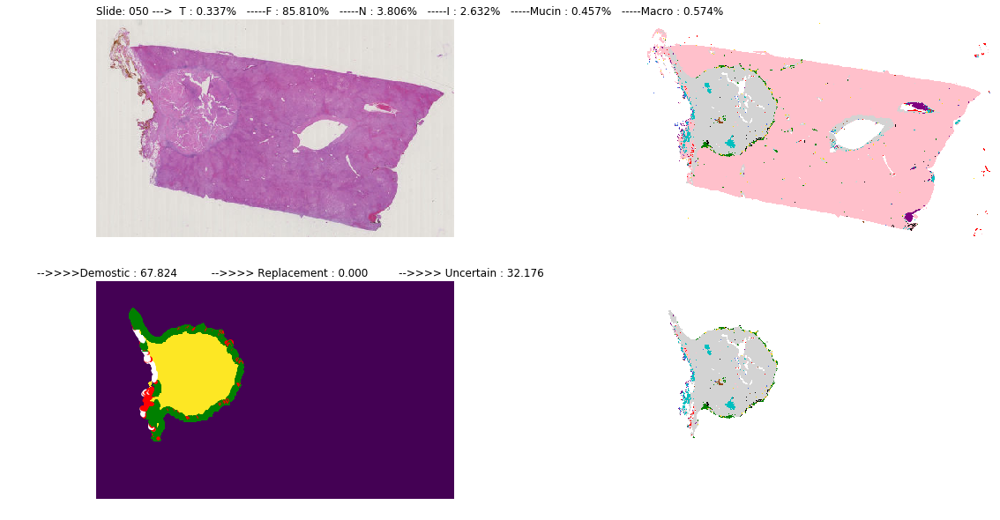

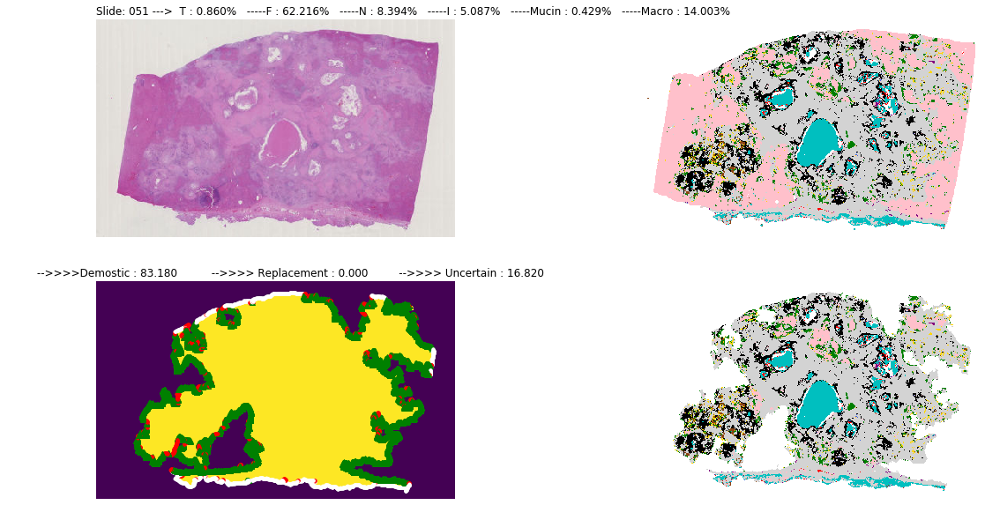

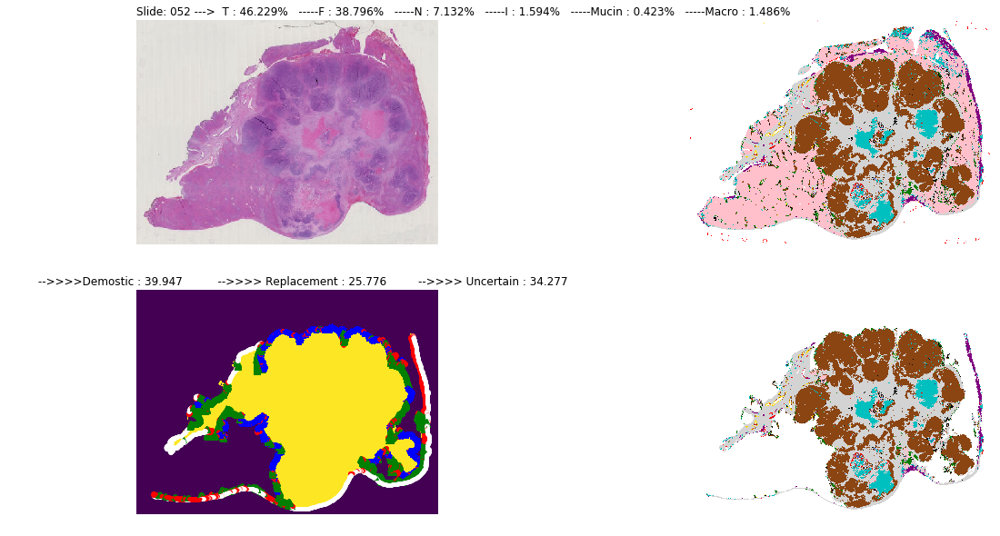

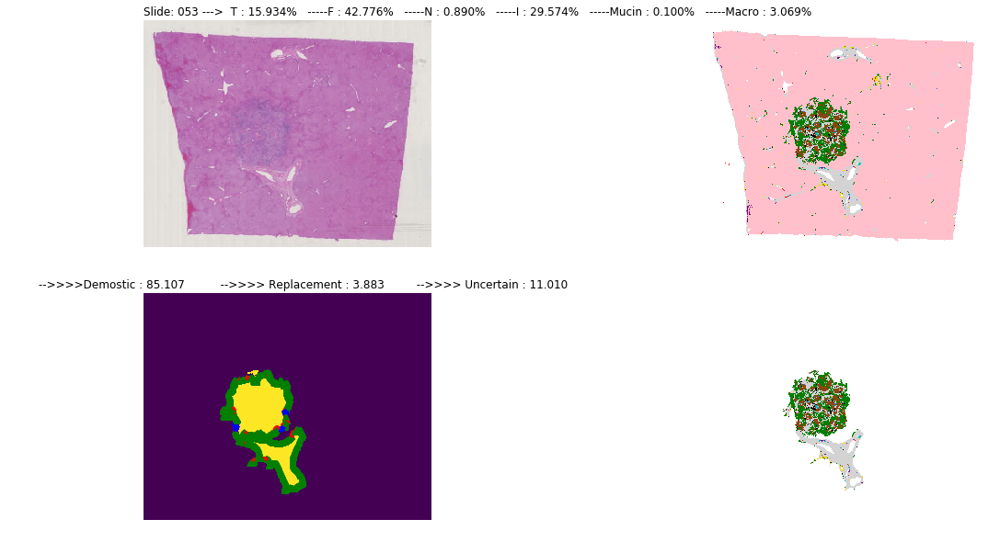

...

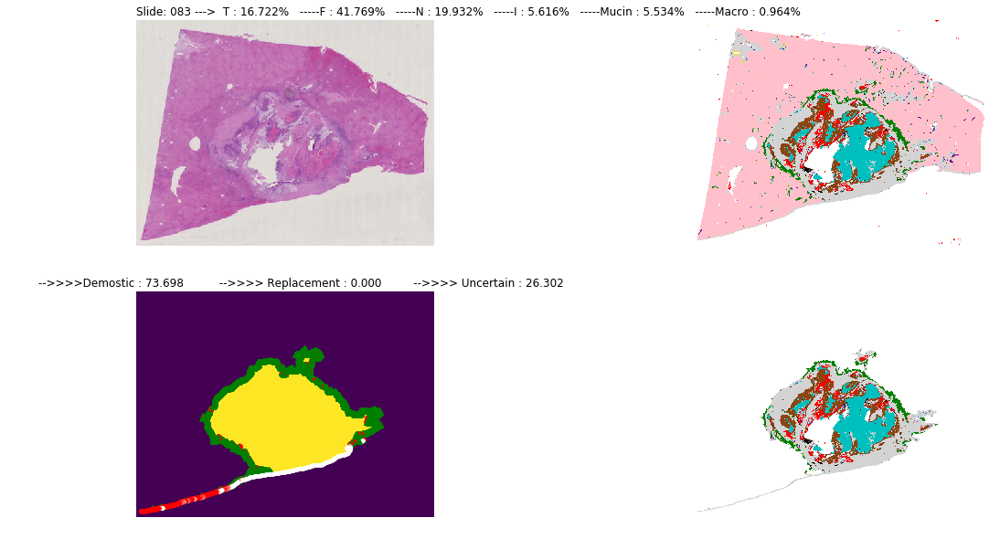

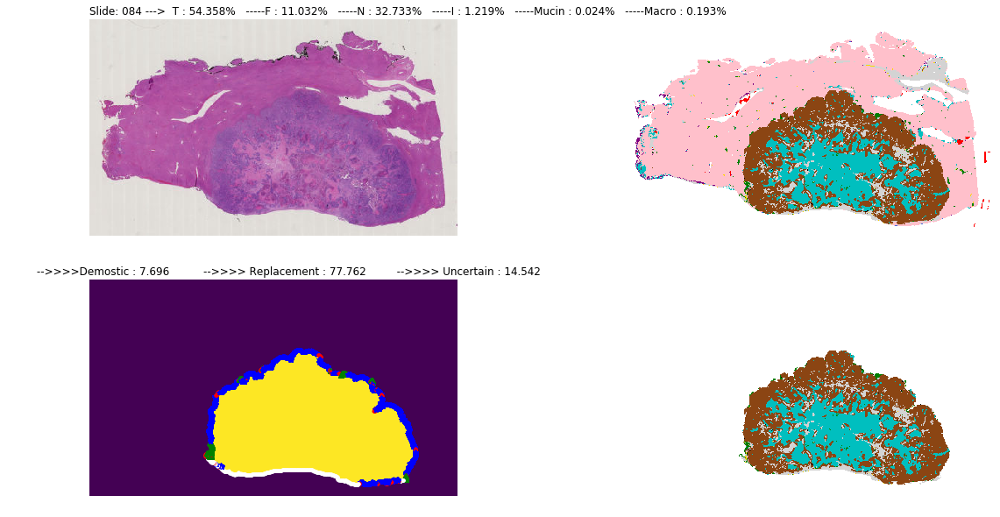

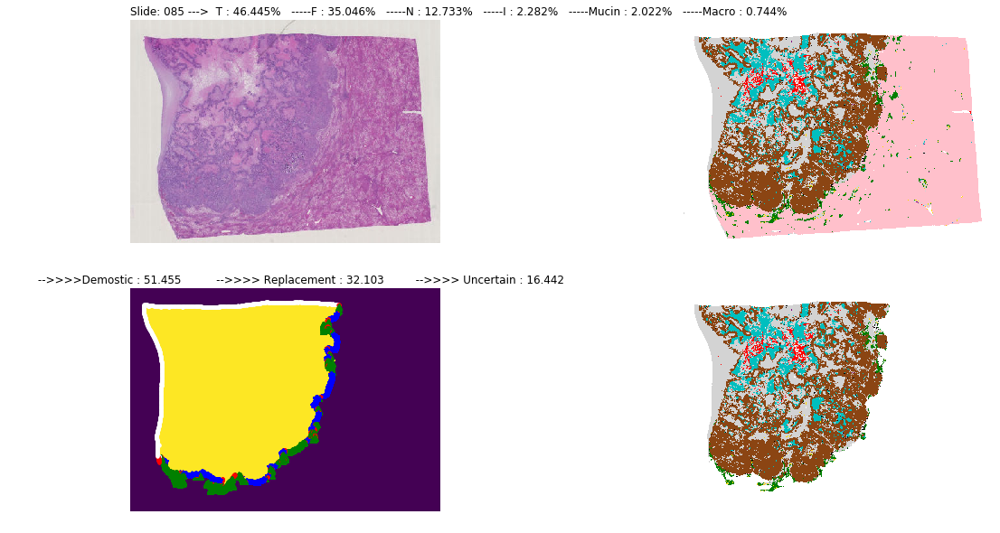

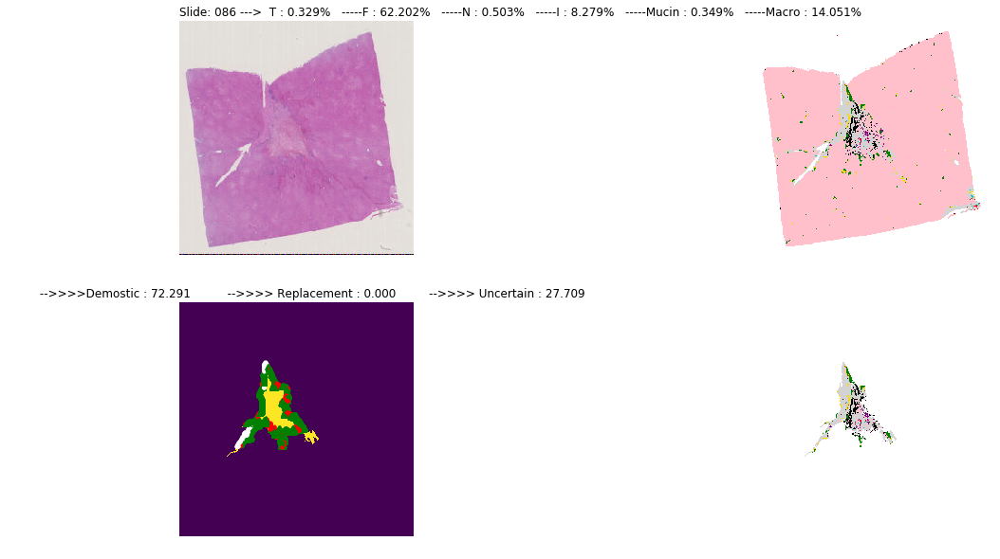

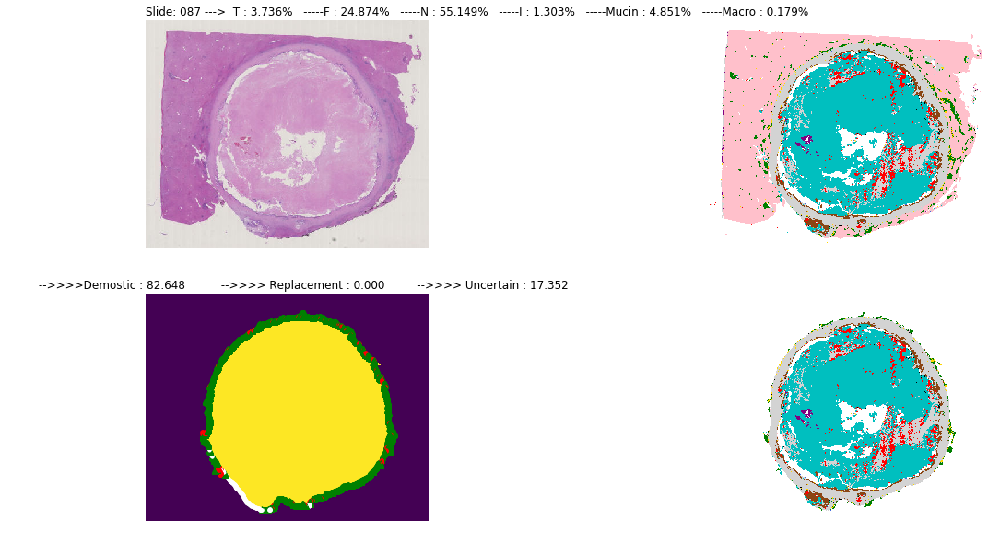

In [4]:
#tmp_index = 75
from matplotlib.colors import ListedColormap

cMap = ListedColormap(['pink','c','lightgrey','saddlebrown','g','r','purple','royalblue','k','white','gold'])
cMap2 = ListedColormap(['pink','c','lightgrey','saddlebrown','g','r','purple','royalblue','k','white','gold','white'])

style = ['g^','b*','w.','r.']
    
for tmp_index in range(49,88):
#for tmp_index in [52,56]:

    wsi = ops.OpenSlide('/home/zyx31/DATA_CRLM/CRLM/Original/CRLM_%03d.ndpi'%tmp_index)
    wsi_image = wsi.read_region((0,0),8,wsi.level_dimensions[8])

    tmp_map = np.load(path+'wsi_%02d.npy'%tmp_index)
    #print(tmp_map.shape)

    tmp_re1 = np.argmax(tmp_map,2)
    tmp_mregion = (tmp_re1==9) + (tmp_re1==0)

    regions = measure.regionprops(measure.label(1-tmp_mregion))
    #plt.imshow(rule_based_mapbak(regions,org_size=tmp_map.shape))

    tmp_mregion = (tmp_re1==9) + (tmp_re1==0)
    tmp_re2 = np.copy(tmp_re1)
    
    tmp_re3 = np.copy(tmp_re1) # add 0-10 to matrix
    tmp_re3[:11,0]  = np.arange(0,11)
    
    #-------------main-ops ------------
    treg2 = rule_based_mapbak(regions,org_size=tmp_map.shape,tumour_ratio=0.2)

    tmp_re2[treg2==0] = 12
    
    # ------------ ops for mark invasive front---------
    
    treg3 = np.copy(treg2.T)
    
    cts = find_contours(treg3,level=0.5)
    #print(len(cts))

    cts_lens = [tct.shape[0] for tct in cts]
    cts_filtered = list(np.where(np.array(cts_lens)>1000)[0])
    
    #-----------visualize------------------
    
    plt.figure(figsize=[20,20])
    plt.subplot(2,2,1)
    plt.imshow(wsi_image)
    plt.axis('off')
    plt.title("Slide: %03d --->  "%tmp_index+"T : %.3f"%(np.sum(tmp_re2==3)/np.sum(tmp_re2!=12)*100)+'%   -----'+\
             "F : %.3f"%(np.sum(tmp_re2==2)/np.sum(tmp_re2!=12)*100)+'%   -----'+\
             "N : %.3f"%(np.sum(tmp_re2==1)/np.sum(tmp_re2!=12)*100)+'%   -----'+\
             "I : %.3f"%(np.sum(tmp_re2==4)/np.sum(tmp_re2!=12)*100)+'%   -----'+\
             "Mucin : %.3f"%(np.sum(tmp_re2==5)/np.sum(tmp_re2!=12)*100)+'%   -----'+\
             "Macro : %.3f"%(np.sum(tmp_re2==8)/np.sum(tmp_re2!=12)*100)+'% ',\
              loc='left')
    
    plt.subplot(2,2,2)
    plt.imshow(tmp_re3.T,cmap=cMap)
    #plt.imshow(tmp_mregion)
    plt.axis('off')
    plt.subplot(2,2,4)
    tmp_re2[:11,0] = [0,1,2,3,4,5,6,7,8,9,10]
    plt.imshow(tmp_re2.T,cmap=cMap2)
    plt.axis('off')
    plt.subplot(2,2,3)
    
    plt.imshow(treg3)
    
    tpe_list = []
    for cindex in cts_filtered:
        counter_list =cts[cindex]
        for i in range(len(counter_list)):
            #print(int(tx),int(ty), check_border(tmp_re1[int(tx)-5:int(tx)+5,int(ty)-5:int(ty)+5]))
            tpe = check_border(i,counter_list)
            tpe_list.append(tpe)
            #pass
            ty,tx = int(counter_list[i][0]),int(counter_list[i][1])
            plt.plot(tx,ty,style[tpe])
            
#     print('         -->>>>Demostic : %.3f'%(np.sum(np.array(tpe_list)==0)/(np.sum(np.array(tpe_list)!=2))*100)+\
#              '          -->>>> Replacement : %.3f'%(np.sum(np.array(tpe_list)==1)/(np.sum(np.array(tpe_list)!=2))*100))
    
    plt.title('         -->>>>Demostic : %.3f'%(np.sum(np.array(tpe_list)==0)/(np.sum(np.array(tpe_list)!=2))*100)+\
             '          -->>>> Replacement : %.3f'%(np.sum(np.array(tpe_list)==1)/(np.sum(np.array(tpe_list)!=2))*100)+\
              '         -->>>> Uncertain : %.3f'%(np.sum(np.array(tpe_list)==3)/(np.sum(np.array(tpe_list)!=2))*100),
             )

    plt.axis('off')


(-0.5, 1055.5, 589.5, -0.5)

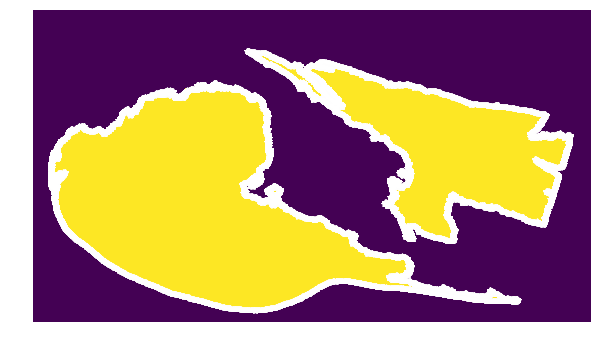

In [66]:
from skimage.measure import find_contours
from skimage.morphology import *

treg3 = np.copy(treg2.T)
cts = find_contours(treg3,level=0.5)
#print(len(cts))

cts_lens = [tct.shape[0] for tct in cts]
cts_filtered = list(np.where(np.array(cts_lens)>1000)[0])


plt.figure(figsize=[10,10])
plt.imshow(treg3)
for ti in cts_filtered:
    plt.plot(cts[ti][:,1],cts[ti][:,0],'w*')

plt.axis('off')

Text(0.5,1,'         -->>>>Demostic : 89.274          -->>>> Replacement : 0.000')

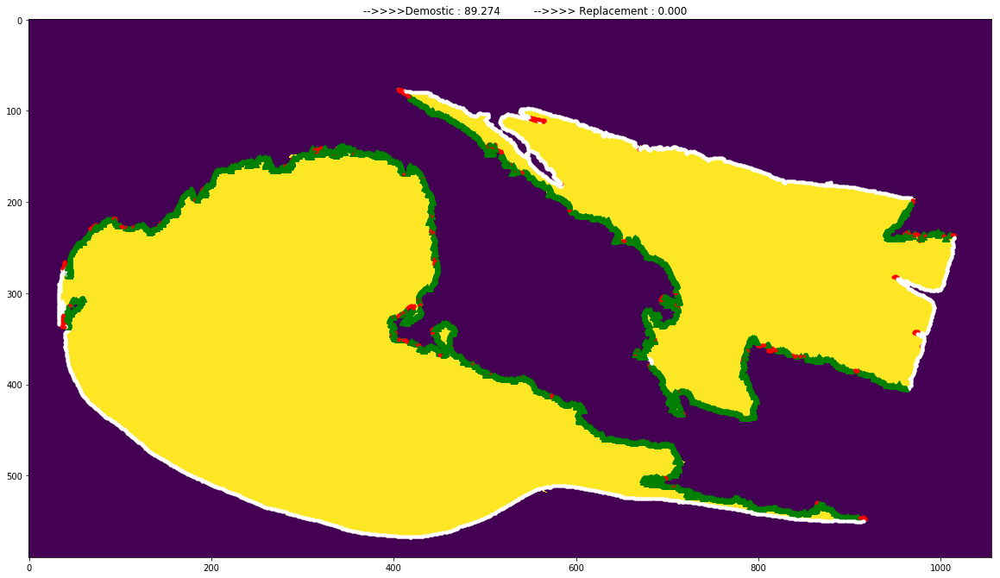

In [229]:
plt.figure(figsize=[20,20])
plt.imshow(treg2.T)

style = ['g^','b*','w.','r.']


for cindex in cts_filtered:
    tpe_list = []
    counter_list =cts[cindex]
    for i in range(len(counter_list)):
        #print(int(tx),int(ty), check_border(tmp_re1[int(tx)-5:int(tx)+5,int(ty)-5:int(ty)+5]))
        tpe = check_border(i,counter_list)
        tpe_list.append(tpe)
        #pass
        ty,tx = int(counter_list[i][0]),int(counter_list[i][1])
        plt.plot(tx,ty,style[tpe])
    
plt.title('         -->>>>Demostic : %.3f'%(np.sum(np.array(tpe_list)==0)/(np.sum(np.array(tpe_list)!=2))*100)+\
         '          -->>>> Replacement : %.3f'%(np.sum(np.array(tpe_list)==1)/(np.sum(np.array(tpe_list)!=2))*100))

In [228]:
np.sum(np.array(tpe_list)==0)

2755

In [191]:
for i in range(10,100,3):
    print(get_components(i,cts[cts_filtered[0]])[1] )


OrderedDict([(0, 161), (2, 114), (4, 48), (7, 1)])
OrderedDict([(0, 154), (2, 142), (4, 27), (7, 1)])
OrderedDict([(2, 169), (0, 148), (4, 7)])
OrderedDict([(2, 185), (0, 138), (4, 1)])
OrderedDict([(2, 171), (0, 152), (4, 1)])
OrderedDict([(2, 167), (0, 156), (4, 1)])
OrderedDict([(2, 177), (0, 145), (4, 2)])
OrderedDict([(2, 189), (0, 134), (4, 1)])
OrderedDict([(2, 178), (0, 145), (4, 1)])
OrderedDict([(2, 164), (0, 159), (4, 1)])
OrderedDict([(2, 172), (0, 151), (4, 1)])
OrderedDict([(0, 164), (2, 159), (4, 1)])
OrderedDict([(2, 162), (0, 157), (9, 4), (4, 1)])
OrderedDict([(2, 163), (0, 151), (9, 9), (4, 1)])
OrderedDict([(2, 161), (0, 146), (9, 17)])
OrderedDict([(0, 165), (2, 148), (9, 11)])
OrderedDict([(0, 161), (2, 145), (9, 18)])
OrderedDict([(0, 156), (2, 144), (9, 24)])
OrderedDict([(0, 151), (2, 145), (9, 28)])
OrderedDict([(0, 147), (2, 147), (9, 30)])
OrderedDict([(2, 152), (0, 141), (9, 30), (8, 1)])
OrderedDict([(2, 147), (0, 144), (9, 30), (1, 2), (8, 1)])
OrderedDic